#TripoSR

#Instalation and Setup

In [ ]:
# Clone TripoSR
!git clone https://github.com/VAST-AI-Research/TripoSR.git


fatal: destination path 'TripoSR' already exists and is not an empty directory.


In [ ]:
!pip install --upgrade setuptools

In [ ]:
%cd TripoSR
!pip install -r requirements.txt

/content/TripoSR
  Cloning https://github.com/tatsy/torchmcubes.git to /tmp/pip-req-build-5gu73n_s
  Running command git clone --filter=blob:none --quiet https://github.com/tatsy/torchmcubes.git /tmp/pip-req-build-5gu73n_s
  Resolved https://github.com/tatsy/torchmcubes.git to commit 3381600ddc3d2e4d74222f8495866be5fafbace4
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done


In [ ]:
!pip install onnxruntime-gpu


In [ ]:
!pip install -U transformers==4.37.2 huggingface_hub==0.20.2 accelerate==0.26.1


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.4/129.4 kB 4.9 MB/s eta 0:00:00
INFO: pip is looking at multiple versions of tokenizers to determine which version is compatible with other requirements. This could take a while.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.4/8.4 MB 66.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 330.3/330.3 kB 28.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 270.9/270.9 kB 24.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.6/3.6 MB 78.0 MB/s eta 0:00:00
  Attempting uninstall: huggingface_hub
    Found existing installation: huggingface-hub 0.17.3
    Uninstalling huggingface-hub-0.17.3:
      Successfully uninstalled huggingface-hub-0.17.3
  Attempting uninstall: tokenizers
    Found existing installation: tokenizers 0.14.1
    Uninstalling tokenizers-0.14.1:
      Successfully uninstalled tokenizers-0.14.1
  Attempting uninstall: transformers
    Found existing installation: transformers 4.35.0
   

#Check the model

Run an example provided

In [ ]:
!python run.py examples/marble.png --output-dir output/ --render

2025-04-06 19:21:05,663 - INFO - Initializing model ...
config.yaml: 100% 987/987 [00:00<00:00, 3.97MB/s]
model.ckpt: 100% 1.68G/1.68G [00:11<00:00, 143MB/s]
The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.
0it [00:00, ?it/s]
config.json: 100% 454/454 [00:00<00:00, 2.73MB/s]
2025-04-06 19:21:32,681 - INFO - Initializing model finished in 27017.65ms.
2025-04-06 19:21:32,681 - INFO - Processing images ...
100%|████████████████████████████████████████| 176M/176M [00:00<00:00, 858GB/s]
2025-04-06 19:21:37,192 - INFO - Processing images finished in 4510.89ms.
2025-04-06 19:21:37,192 - INFO - Running image 1/1 ...
2025-04-06 19:21:37,192 - INFO - Running model ...
2025-04-06 19:21:38,377 - INFO - Running model finished in 1184.85ms.
2025-04-06 19:21:38,377 - INFO - Rendering ...
/content/TripoSR/tsr/utils.py:376

##Visualize the result

In [ ]:
!pip install trimesh pythreejs


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.4/3.4 MB 34.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 271.7/271.7 kB 14.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 58.1 MB/s eta 0:00:00


In [ ]:
import trimesh
from IPython.display import display

In [ ]:
mesh = trimesh.load("output/0/mesh.obj")
scene = mesh.scene()
scene.show()

#Evaluate the model

##Load Data

Data taken from the [Pascal3D+ dataset](https://cvgl.stanford.edu/projects/pascal3d.html).

In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
# Path to image and CAD model from Drive
# image_path = "/content/drive/MyDrive/TAVA/PASCAL3D+_release1.0/Images/aeroplane_pascal/2008_000033.jpg"
image_path ="/content/drive/MyDrive/TAVA/ratchet.png"
cad_path = "/content/drive/MyDrive/TAVA/PASCAL3D+_release1.0/CAD/aeroplane.mat"

# Copy image locally for TripoSR
!mkdir eval_images
!cp "{image_path}" eval_images/

# Copy CAD locally
!cp "{cad_path}" .


##Run inference

In [ ]:
import os
import subprocess

# Assuming your image is now inside eval_images/
img_file = os.listdir("eval_images")[0]
img_path = os.path.join("eval_images", img_file)
output_dir = "output_pascal_eval"

# Run TripoSR inference
!python run.py {img_path} --output-dir {output_dir}


2025-04-07 18:14:14,296 - INFO - Initializing model ...
config.yaml: 100% 987/987 [00:00<00:00, 4.24MB/s]
model.ckpt: 100% 1.68G/1.68G [00:08<00:00, 190MB/s]
The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.
0it [00:00, ?it/s]
config.json: 100% 454/454 [00:00<00:00, 2.71MB/s]
2025-04-07 18:14:38,079 - INFO - Initializing model finished in 23782.31ms.
2025-04-07 18:14:38,079 - INFO - Processing images ...
100%|████████████████████████████████████████| 176M/176M [00:00<00:00, 803GB/s]
2025-04-07 18:14:42,528 - INFO - Processing images finished in 4448.89ms.
2025-04-07 18:14:42,528 - INFO - Running image 1/1 ...
2025-04-07 18:14:42,528 - INFO - Running model ...
2025-04-07 18:14:43,733 - INFO - Running model finished in 1204.94ms.
2025-04-07 18:14:43,733 - INFO - Extracting mesh ...
2025-04-07 18:14:47,021 - I

In [ ]:
output_mesh = trimesh.load(output_dir+"/0/mesh.obj")
scene = output_mesh.scene()
scene.show()

##Evaluate

In [ ]:
import scipy.io
import trimesh
import numpy as np
from sklearn.neighbors import NearestNeighbors
from os.path import splitext, join
from math import sqrt

In [ ]:
import scipy.io

mat = scipy.io.loadmat(cad_path)
print(mat.keys())


dict_keys(['__header__', '__version__', '__globals__', 'aeroplane'])


In [ ]:

# Load ground-truth CAD mesh
cad_mat = scipy.io.loadmat(cad_path)
cad_model = cad_mat['aeroplane'][0, 0]
gt_vertices = cad_model['vertices']
gt_faces = cad_model['faces'] - 1  # Convert MATLAB 1-index to 0-index
gt_mesh = trimesh.Trimesh(vertices=gt_vertices, faces=gt_faces)

# Load predicted mesh from TripoSR
# ply_name = splitext(img_file)[0] + ".ply"
# pred_mesh_path = join(output_dir, ply_name)
# pred_mesh = trimesh.load(pred_mesh_path)
pred_mesh = output_mesh

# Sample points on both meshes
N = 10000
pred_points, _ = trimesh.sample.sample_surface(pred_mesh, N)
gt_points, _ = trimesh.sample.sample_surface(gt_mesh, N)

In [ ]:
scene = gt_mesh.scene()
scene.show()

In [ ]:
# --- CHAMFER DISTANCE ---
def chamfer_distance(p1, p2):
    nn1 = NearestNeighbors(n_neighbors=1).fit(p2)
    d1, _ = nn1.kneighbors(p1)
    nn2 = NearestNeighbors(n_neighbors=1).fit(p1)
    d2, _ = nn2.kneighbors(p2)
    return float(np.mean(d1)) + float(np.mean(d2))

# --- THRESHOLDED F1 SCORE ---
def compute_f1(pred_points, gt_points, threshold=0.01):
    nn = NearestNeighbors(n_neighbors=1).fit(gt_points)
    dist_pred, _ = nn.kneighbors(pred_points)
    nn = NearestNeighbors(n_neighbors=1).fit(pred_points)
    dist_gt, _ = nn.kneighbors(gt_points)

    precision = np.mean(dist_pred < threshold)
    recall = np.mean(dist_gt < threshold)
    if precision + recall == 0:
        return 0.0
    return 2 * (precision * recall) / (precision + recall)

# --- RMSE FUNCTION ---
def compute_rmse(pred_points, gt_points):
    nn = NearestNeighbors(n_neighbors=1).fit(gt_points)
    dists, _ = nn.kneighbors(pred_points)
    return np.sqrt(np.mean(dists ** 2))


In [ ]:
chanfer_dst = chamfer_distance(pred_points, gt_points)
f1_score = compute_f1(pred_points, gt_points, threshold=0.01)
rmse = compute_rmse(pred_points, gt_points)

print("Evaluation Results:")
print(f"Chamfer Distance:   {chanfer_dst:.6f}")
print(f"RMSE (position error):        {rmse:.6f}")
print(f"F1 score:    {f1_score}")


Evaluation Results:
Chamfer Distance (Forward):   0.074311
Chamfer Distance (Backward):  0.039054
Chamfer Distance (Total):     0.113365
RMSE (position error):        0.182163
Edge Sharpness Difference:    1487 edges


#Evaluation on multiple Images

Based on the TripSR evaluation code.

In [ ]:
!pip install open3d

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 447.7/447.7 MB 3.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.9/7.9 MB 42.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 101.7/101.7 kB 9.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.8/139.8 kB 9.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 228.0/228.0 kB 19.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 64.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 59.5 MB/s eta 0:00:00
  Attempting uninstall: widgetsnbextension
    Found existing installation: widgetsnbextension 3.6.10
    Uninstalling widgetsnbextension-3.6.10:
      Successfully uninstalled widgetsnbextension-3.6.10
  Attempting uninstall: werkzeug
    Found existing installation: Werkzeug 3.1.3
    Uninstalling Werkzeug-3.1.3:
      Successfully uninstalled Werkzeug-3.1.3
  Attempting uninstall: flask
    Found existing installation: Flask 3.1.0
    Uninst

In [ ]:
import os
import glob
import shutil
import subprocess
import trimesh
import numpy as np
import pandas as pd
from sklearn.neighbors import NearestNeighbors
from sklearn.metrics import f1_score, mean_squared_error
import scipy.io
import open3d as o3d


In [ ]:
# --- CONFIGURATION ---
TRIPOSR_RUN_SCRIPT = "run.py"
EVAL_IMAGE_DIR = "eval_images"
OUTPUT_DIR = "output_pascal_eval"
IMAGE_FILES = {
    "aeroplane": "/content/drive/MyDrive/TAVA/PASCAL3D+_release1.0/Images/aeroplane_pascal/2008_000033.jpg",
    "sofa": "/content/drive/MyDrive/TAVA/PASCAL3D+_release1.0/Images/sofa_pascal/2009_001146.jpg",
}
# CAD_FILES = {
#     "aeroplane": "/content/drive/MyDrive/TAVA/PASCAL3D+_release1.0/Annotations/aeroplane_pascal/2008_000033.mat",
#     "sofa": "/content/drive/MyDrive/TAVA/PASCAL3D+_release1.0/Annotations/sofa_pascal/2009_001146.mat",
# }
CAD_FILES = {
    "aeroplane": "/content/drive/MyDrive/TAVA/PASCAL3D+_release1.0/CAD/aeroplane.mat",
    "sofa": "/content/drive/MyDrive/TAVA/PASCAL3D+_release1.0/CAD/sofa.mat",
}


# --- PREPARE IMAGES ---
os.makedirs(EVAL_IMAGE_DIR, exist_ok=True)
image_paths = []
for label, path in IMAGE_FILES.items():
    dest = os.path.join(EVAL_IMAGE_DIR, os.path.basename(path))
    shutil.copy(path, dest)
    image_paths.append(dest)

In [ ]:
mat = scipy.io.loadmat(CAD_FILES["aeroplane"])
print(mat.keys())

dict_keys(['__header__', '__version__', '__globals__', 'record'])


In [ ]:
# --- RUN INFERENCE ---
print("Running TripoSR inference...")
image_args = " ".join(image_paths)
cmd = f"python {TRIPOSR_RUN_SCRIPT} {image_args} --output-dir {OUTPUT_DIR}"
ret = subprocess.run(cmd, shell=True)
if ret.returncode != 0:
    print("Error: TripoSR failed to run. Please check run.py path and environment.")
    exit(1)

Running TripoSR inference...


In [ ]:

# --- EVALUATE ---
print("Evaluating outputs...")
results = []

for idx, (label, img_path) in enumerate(IMAGE_FILES.items()):
    pred_mesh_path = os.path.join(OUTPUT_DIR, str(idx), "mesh.obj")
    cad_path = CAD_FILES[label]
    base = os.path.splitext(os.path.basename(img_path))[0]

    if not os.path.exists(pred_mesh_path):
        print(f"Missing prediction mesh for {label} at {pred_mesh_path}. Skipping.")
        continue

    print(f"Evaluating {label}...")

    # Load prediction mesh and sample points
    pred_mesh = trimesh.load(pred_mesh_path)
    pred_points, _ = trimesh.sample.sample_surface(pred_mesh, 10000)

    # Load GT mesh from CAD file
    cad_mat = scipy.io.loadmat(cad_path)
    cad_model = cad_mat[label][0, 0]
    gt_vertices = cad_model["vertices"]
    gt_faces = cad_model["faces"] - 1
    gt_mesh = trimesh.Trimesh(vertices=gt_vertices, faces=gt_faces)
    gt_points, _ = trimesh.sample.sample_surface(gt_mesh, 10000)

    # --- Evaluate BEFORE alignment ---
    cd = chamfer_distance(pred_points, gt_points)
    f1 = compute_f1(pred_points, gt_points, threshold=0.01)
    rmse = compute_rmse(pred_points, gt_points)

    # --- Align using ICP ---
    def to_o3d(points):
        pcd = o3d.geometry.PointCloud()
        pcd.points = o3d.utility.Vector3dVector(points)
        return pcd

    source_pcd = to_o3d(pred_points)
    target_pcd = to_o3d(gt_points)

    threshold = 0.05
    trans_init = np.eye(4)
    icp_result = o3d.pipelines.registration.registration_icp(
        source_pcd, target_pcd, threshold, trans_init,
        o3d.pipelines.registration.TransformationEstimationPointToPoint()
    )
    aligned_pcd = source_pcd.transform(icp_result.transformation)
    aligned_pred_points = np.asarray(aligned_pcd.points)

    # --- Evaluate AFTER alignment ---
    cd_aligned = chamfer_distance(aligned_pred_points, gt_points)
    f1_aligned = compute_f1(aligned_pred_points, gt_points, threshold=0.01)
    rmse_aligned = compute_rmse(aligned_pred_points, gt_points)

    results.append({
        "label": label,
        "image": base,
        "chamfer_distance": cd,
        "f1_score": f1,
        "rmse": rmse,
        "chamfer_distance_aligned": cd_aligned,
        "f1_score_aligned": f1_aligned,
        "rmse_aligned": rmse_aligned
    })




Evaluating outputs...
Evaluating aeroplane...
Evaluating sofa...


In [ ]:
# --- SHOW RESULTS ---
df = pd.DataFrame(results)
print("\nEvaluation Results:")
print(df.to_string(index=False))
df.to_csv("pascal3d_triposr_aligned_eval.csv", index=False)


Evaluation Results:
    label       image  chamfer_distance  f1_score     rmse  chamfer_distance_aligned  f1_score_aligned  rmse_aligned
aeroplane 2008_000033          0.111966  0.132166 0.092606                  0.067341          0.199770      0.059442
     sofa 2009_001146          0.255166  0.040499 0.171280                  0.231487          0.047349      0.165407


In [ ]:
import matplotlib.pyplot as plt

# --- PLOTTING FUNCTION ---
def plot_gt_and_pred(gt_mesh, pred_mesh, title):
    fig = plt.figure(figsize=(12, 6))

    ax1 = fig.add_subplot(121, projection='3d')
    ax1.plot_trisurf(gt_mesh.vertices[:, 0], gt_mesh.vertices[:, 1], gt_mesh.faces, gt_mesh.vertices[:, 2], color='blue', alpha=0.6)
    ax1.set_title(f"{title} - Ground Truth")
    ax1.axis("off")

    ax2 = fig.add_subplot(122, projection='3d')
    ax2.plot_trisurf(pred_mesh.vertices[:, 0], pred_mesh.vertices[:, 1], pred_mesh.faces, pred_mesh.vertices[:, 2], color='orange', alpha=0.6)
    ax2.set_title(f"{title} - Prediction")
    ax2.axis("off")

    plt.tight_layout()
    plt.show()


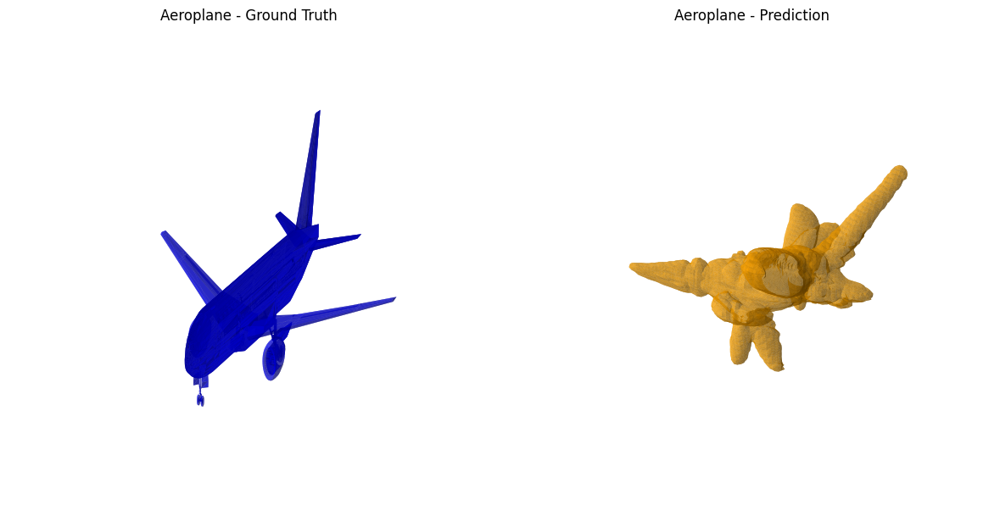

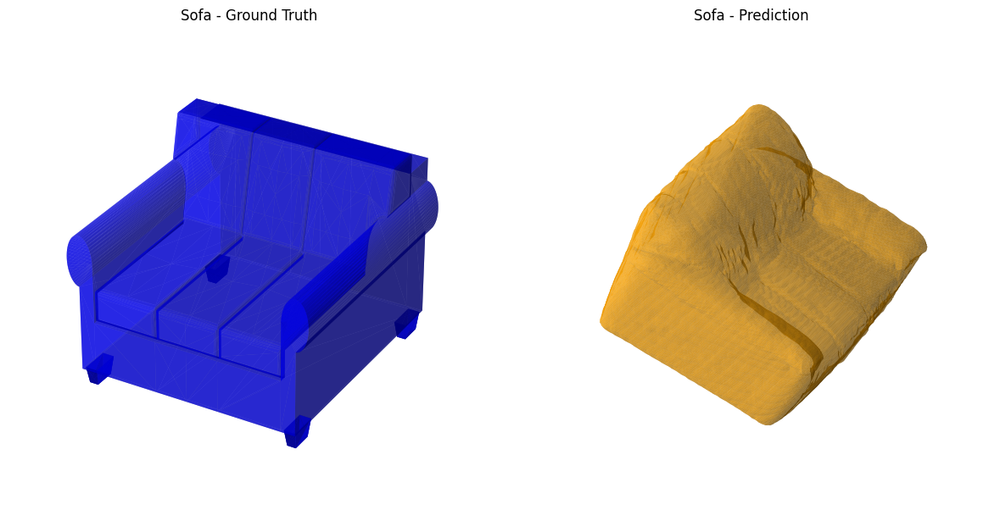

In [ ]:
# --- CONFIGURATION ---
PREDICTED_MESH_PATHS = {
    "aeroplane": "/content/TripoSR/output_pascal_eval/0/mesh.obj",
    "sofa": "/content/TripoSR/output_pascal_eval/1/mesh.obj"
}

GT_CAD_PATHS = {
    "aeroplane": "/content/drive/MyDrive/TAVA/PASCAL3D+_release1.0/CAD/aeroplane.mat",
    "sofa": "/content/drive/MyDrive/TAVA/PASCAL3D+_release1.0/CAD/sofa.mat"
}

# --- LOOP THROUGH CLASSES ---
for label in ["aeroplane", "sofa"]:
    # Load predicted mesh
    pred_mesh_path = PREDICTED_MESH_PATHS[label]
    if not os.path.exists(pred_mesh_path):
        print(f"Prediction mesh not found for {label} at {pred_mesh_path}")
        continue
    pred_mesh = trimesh.load(pred_mesh_path)

    # Load GT CAD mesh
    gt_mat = scipy.io.loadmat(GT_CAD_PATHS[label])
    gt_model = gt_mat[label][0, 0]
    gt_mesh = trimesh.Trimesh(vertices=gt_model["vertices"], faces=gt_model["faces"] - 1)

    # Plot both
    plot_gt_and_pred(gt_mesh, pred_mesh, label.capitalize())

In [ ]:
output_mesh = trimesh.load("/content/TripoSR/output_pascal_eval/0/mesh.obj")
scene = output_mesh.scene()
scene.show()

In [ ]:
output_mesh = trimesh.load("/content/TripoSR/output_pascal_eval/1/mesh.obj")
scene = output_mesh.scene()
scene.show()